
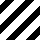
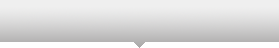
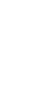
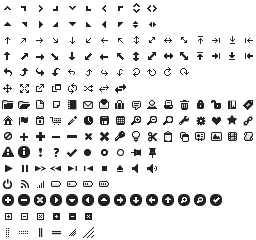
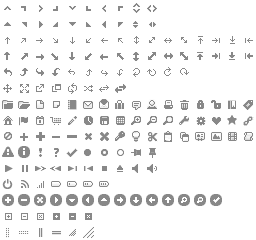
...
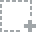
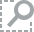
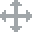
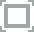
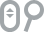

In [49]:
import pandas as pd
from django_pandas.io import read_frame

from bokeh.plotting import figure, show, output_notebook
from bokeh.models.formatters import DatetimeTickFormatter
output_notebook()

In [2]:
def experiment(pk):
    pk = 11
    device = Device.objects.get(device_id=pk)
    measurements = device.to_measurements.all()

    data = {}
    for measure in measurements:
        d = {}
        for k, v in measure.measurements.items():
            d[k] = float(v.split()[0])
        data[measure.tstamp] = d

    # dates = sorted(data.keys())
    df = pd.DataFrame.from_dict(data, orient='index')
    plt = figure(logo=None, x_axis_type="datetime")
    for col in df.columns:
        plt.line(df.index, df[col])

    show(plt)

In [54]:
%timeit measurements = read_frame(Device.objects.get(device_id=2).to_measurements.all())

1 loops, best of 3: 10.1 s per loop


In [55]:
%timeit Device.objects.get(device_id=2).to_measurements.all()

The slowest run took 69.94 times longer than the fastest. This could mean that an intermediate result is being cached 
100 loops, best of 3: 1.64 ms per loop


In [56]:
x = Device.objects.get(device_id=2).to_measurements.all()

In [59]:
x0 = x[0]

In [64]:
    device = Device.objects.get(device_id=11)
    measurements = device.to_measurements.all()

In [66]:
measurements[0]

<Measurements: Мерања за уред 1 за 09.04.2015>

In [67]:
%lprun -f experiment experiment(11)

In [89]:
%timeit x = [d.to_measurements.latest('tstamp').measurements for d in Device.objects.all() if d.to_measurements.first()]

1 loops, best of 3: 7.48 s per loop


In [125]:
def test():
    data = {}
    for device in Device.objects.all().exclude(read_tstamp=None).values_list(
            'device_id', flat=True):

        m = device.to_measurements.latest('tstamp').measurements
        data[device.pk] = (device.address, m)


In [126]:
%timeit test()

AttributeError: 'int' object has no attribute 'to_measurements'

In [124]:
devices = Device.objects.all().exclude(read_tstamp=None).values_list('device_id', flat=True)
devices

[11, 8, 7, 6, 2, 10, 5, 9, 12]

In [101]:
m = Measurements.objects.filter(device_id=11)
m.latest('tstamp').measurements

{'GK1_CONTROL_ENABLED': '1',
 'GK1_GREJNA_KRIVA': '15.5',
 'GK1_MAX_PROTOK': '2.000 m3/h',
 'GK1_PROTOK': '0.000 m3/h',
 'GK1_SOSTOJBA': '282843.0 kWh',
 'GK1_T_DOVOD': '18.700 °C',
 'GK1_T_KOREKCIJA': '0',
 'GK1_T_MAX': '67 °C',
 'GK1_T_MIN': '29 °C',
 'GK1_T_POMAK': '2.1',
 'GK1_T_POVRAT_RADIJATORI': '19.64 °C',
 'GK1_T_REDUKCIJA': '10',
 'GK1_T_VLEZ_RADIJATORI': '20.92 °C',
 'GK1_T_VLEZ_RADIJATORI_PRESMETANA': '33 °C',
 'GK1_VENTIL_OTVORENOST': '40 %',
 'GK1_VOLUMEN': '13662.6 m3',
 'PRITISOK_DOVOD': '5.161 bar',
 'PRITISOK_POVRAT': '5.232 bar',
 'PRITISOK_REGULATOR': '5.137 bar',
 'SIGNAL_VRATA_ORMAR_OTVORENA': '1',
 'SIGNAL_VRATA_PODSTANICA_OTVORENA': '1',
 'T_NADVORESNA': '14.60 °C',
 'T_NADVORESNA_PRESMETANA': '14.58 °C',
 'T_SOBNA': '20 °C'}

In [32]:
device.to_measurements.latest("tstamp").measurements.items()

dict_items([('GK1_T_MIN', '29 °C'), ('GK1_VENTIL_OTVORENOST', '40 %'), ('PRITISOK_POVRAT', '0.516 bar'), ('PRITISOK_DOVOD', '1.365 bar'), ('T_NADVORESNA', '18.34 °C'), ('GK1_T_POVRAT_RADIJATORI', '18.80 °C'), ('SIGNAL_VRATA_ORMAR_OTVORENA', '0'), ('GK1_T_POMAK', '2.1'), ('GK1_T_VLEZ_RADIJATORI', '19.58 °C'), ('GK1_MAX_PROTOK', '2.000 m3/h'), ('GK1_T_KOREKCIJA', '0'), ('GK1_PROTOK', '0.000 m3/h'), ('PRITISOK_REGULATOR', '0.575 bar'), ('GK1_GREJNA_KRIVA', '15.5'), ('GK1_T_VLEZ_RADIJATORI_PRESMETANA', '33 °C'), ('GK1_T_DOVOD', '18.500 °C'), ('GK1_T_REDUKCIJA', '10'), ('T_NADVORESNA_PRESMETANA', '18.29 °C'), ('GK1_T_MAX', '67 °C'), ('GK1_VOLUMEN', '3246.4 m3'), ('SIGNAL_VRATA_PODSTANICA_OTVORENA', '0'), ('T_SOBNA', '20 °C'), ('GK1_SOSTOJBA', '79570.0 kWh'), ('GK1_CONTROL_ENABLED', '1')])

In [33]:
type(devices)

django.db.models.query.QuerySet

In [34]:
device.to_measurements.latest('tstamp').measurements

{'GK1_CONTROL_ENABLED': '1',
 'GK1_GREJNA_KRIVA': '15.5',
 'GK1_MAX_PROTOK': '2.000 m3/h',
 'GK1_PROTOK': '0.000 m3/h',
 'GK1_SOSTOJBA': '79570.0 kWh',
 'GK1_T_DOVOD': '18.500 °C',
 'GK1_T_KOREKCIJA': '0',
 'GK1_T_MAX': '67 °C',
 'GK1_T_MIN': '29 °C',
 'GK1_T_POMAK': '2.1',
 'GK1_T_POVRAT_RADIJATORI': '18.80 °C',
 'GK1_T_REDUKCIJA': '10',
 'GK1_T_VLEZ_RADIJATORI': '19.58 °C',
 'GK1_T_VLEZ_RADIJATORI_PRESMETANA': '33 °C',
 'GK1_VENTIL_OTVORENOST': '40 %',
 'GK1_VOLUMEN': '3246.4 m3',
 'PRITISOK_DOVOD': '1.365 bar',
 'PRITISOK_POVRAT': '0.516 bar',
 'PRITISOK_REGULATOR': '0.575 bar',
 'SIGNAL_VRATA_ORMAR_OTVORENA': '0',
 'SIGNAL_VRATA_PODSTANICA_OTVORENA': '0',
 'T_NADVORESNA': '18.34 °C',
 'T_NADVORESNA_PRESMETANA': '18.29 °C',
 'T_SOBNA': '20 °C'}

In [35]:
device.pk

5

In [36]:
data = {}
m = device.to_measurements.latest('tstamp').measurements
data[device.pk] = (device.address, m)

In [46]:
[(x, y, z) for x, (y, z) in data.items()]

[(5,
  'БЕГ управна зграда',
  {'GK1_CONTROL_ENABLED': '1',
   'GK1_GREJNA_KRIVA': '15.5',
   'GK1_MAX_PROTOK': '2.000 m3/h',
   'GK1_PROTOK': '0.000 m3/h',
   'GK1_SOSTOJBA': '79570.0 kWh',
   'GK1_T_DOVOD': '18.500 °C',
   'GK1_T_KOREKCIJA': '0',
   'GK1_T_MAX': '67 °C',
   'GK1_T_MIN': '29 °C',
   'GK1_T_POMAK': '2.1',
   'GK1_T_POVRAT_RADIJATORI': '18.80 °C',
   'GK1_T_REDUKCIJA': '10',
   'GK1_T_VLEZ_RADIJATORI': '19.58 °C',
   'GK1_T_VLEZ_RADIJATORI_PRESMETANA': '33 °C',
   'GK1_VENTIL_OTVORENOST': '40 %',
   'GK1_VOLUMEN': '3246.4 m3',
   'PRITISOK_DOVOD': '1.365 bar',
   'PRITISOK_POVRAT': '0.516 bar',
   'PRITISOK_REGULATOR': '0.575 bar',
   'SIGNAL_VRATA_ORMAR_OTVORENA': '0',
   'SIGNAL_VRATA_PODSTANICA_OTVORENA': '0',
   'T_NADVORESNA': '18.34 °C',
   'T_NADVORESNA_PRESMETANA': '18.29 °C',
   'T_SOBNA': '20 °C'})]

In [41]:
list(data.items())[1]

IndexError: list index out of range

In [68]:
    device = Device.objects.get(device_id=pk)
    measurements = device.to_measurements.all()
    # variables = set([x for y in [measurement.measurements.keys() for
    #                  measurement in measurements] for x in y])

    # cast json measurements
    data = {}
    for measure in measurements:
        d = {}
        for k, v in measure.measurements.items():
            num = v.split()[0]
            d[k] = float(num) if '.' in num else int(num)
        data[measure.tstamp] = d


In [72]:
len(data.keys())

26662

In [73]:
df = pd.DataFrame.from_dict(data)

In [74]:
df = pd.DataFrame.from_dict(data, orient='index')

In [76]:
from collections import OrderedDict

In [77]:
dd = OrderedDict(sorted(data.items()))

In [79]:
df = pd.DataFrame.from_dict(dd)